# Table of Contents
1. [Introduction](#introduction)
2. [Retrieve jobs from Ceph and map to JSON dataframe](#display-jobs-in-dataframe)
3. [Inspection Run Results](#inspection)
3. [Identify parameters that are not constant](#non-constant-parameters)
3. [Separation of left and right clusters](#seperate-left-and-right)
4. [Descriptive analysis](#descriptive-analysis)


## Introduction <a name="introduction"></a>

**Overview**

The purpose of this notebook is to further analyze the statistics regarding the inspection results produced by Amun (https://github.com/thoth-station/amun-api). The conclusions in this notebook are important to identify how the inspection jobs performed in the environment and what trends in data are present. Understanding the inspection job results can help identify the environment needed to perform the tests for the AI stacks. 



## Retrieve jobs from Ceph and map to JSON dataframe <a name="display-jobs-in-dataframe"></a>

In [3]:
%env THOTH_DEPLOYMENT_NAME     thoth-core-upshift-stage
%env THOTH_CEPH_BUCKET         thoth
%env THOTH_CEPH_BUCKET_PREFIX  data/thoth
%env THOTH_S3_ENDPOINT_URL     https://s3.upshift.redhat.com/

env: THOTH_DEPLOYMENT_NAME=thoth-core-upshift-stage
env: THOTH_CEPH_BUCKET=thoth
env: THOTH_CEPH_BUCKET_PREFIX=data/thoth
env: THOTH_S3_ENDPOINT_URL=https://s3.upshift.redhat.com/


In [4]:
import pandas as pd
from pandas.io.json import json_normalize
from pandas_profiling import ProfileReport as profile
from typing import List, Union
from thoth.storages import InspectionResultsStore
from thoth.lab import inspection
from thoth.lab import underscore
from pandas.plotting import lag_plot
import seaborn as sns


pd.set_option("max_colwidth", 800)
pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import plotly.plotly as py
import plotly.tools as tls
import plotly.offline as py

In [6]:
inspection_store = InspectionResultsStore(region="eu-central-1")
inspection_store.connect()

In [7]:
inspection_results = []

for document_id, document in inspection_store.iterate_results():
    # pop build logs to save some memory (not necessary for now)
    document["build_log"] = None

    inspection_results.append(document)

In [8]:
df_original = json_normalize(inspection_results, sep = ".")  # each row resembles InspectionResult

In [9]:
#Display the original data from the inspection results store
df_original

,build_log,created,inspection_id,job_log.exit_code,job_log.hwinfo.cpu.has_3dnow,job_log.hwinfo.cpu.has_3dnowext,job_log.hwinfo.cpu.has_Altivec,job_log.hwinfo.cpu.has_f00f_bug,job_log.hwinfo.cpu.has_fdiv_bug,job_log.hwinfo.cpu.has_mmx,job_log.hwinfo.cpu.has_sse,job_log.hwinfo.cpu.has_sse2,job_log.hwinfo.cpu.has_sse3,job_log.hwinfo.cpu.has_ssse3,job_log.hwinfo.cpu.is_32bit,job_log.hwinfo.cpu.is_64bit,job_log.hwinfo.cpu.is_AMD,job_log.hwinfo.cpu.is_AMD64,job_log.hwinfo.cpu.is_Alpha,job_log.hwinfo.cpu.is_Athlon64,job_log.hwinfo.cpu.is_AthlonHX,job_log.hwinfo.cpu.is_AthlonK6,job_log.hwinfo.cpu.is_AthlonK6_2,job_log.hwinfo.cpu.is_AthlonK6_3,job_log.hwinfo.cpu.is_AthlonK7,job_log.hwinfo.cpu.is_AthlonMP,job_log.hwinfo.cpu.is_Celeron,job_log.hwinfo.cpu.is_Core2,job_log.hwinfo.cpu.is_EV4,job_log.hwinfo.cpu.is_EV5,job_log.hwinfo.cpu.is_EV56,job_log.hwinfo.cpu.is_Hammer,job_log.hwinfo.cpu.is_Intel,job_log.hwinfo.cpu.is_Itanium,job_log.hwinfo.cpu.is_Nocona,job_log.hwinfo.cpu.is_Opteron,job_log.hwinfo.cpu.is_PCA56,job_log.hwinfo.cpu.is_Pentium,job_log.hwinfo.cpu.is_PentiumII,job_log.hwinfo.cpu.is_PentiumIII,job_log.hwinfo.cpu.is_PentiumIV,job_log.hwinfo.cpu.is_PentiumM,job_log.hwinfo.cpu.is_PentiumMMX,job_log.hwinfo.cpu.is_PentiumPro,job_log.hwinfo.cpu.is_Power,job_log.hwinfo.cpu.is_Power7,job_log.hwinfo.cpu.is_Power8,job_log.hwinfo.cpu.is_Power9,job_log.hwinfo.cpu.is_Prescott,job_log.hwinfo.cpu.is_XEON,job_log.hwinfo.cpu.is_Xeon,job_log.hwinfo.cpu.is_i386,job_log.hwinfo.cpu.is_i486,job_log.hwinfo.cpu.is_i586,job_log.hwinfo.cpu.is_i686,job_log.hwinfo.cpu.is_singleCPU,job_log.hwinfo.cpu.nbits,job_log.hwinfo.cpu.ncpus,job_log.hwinfo.cpu.not_impl,job_log.hwinfo.cpu.try_call,job_log.hwinfo.platform.architecture,job_log.hwinfo.platform.machine,job_log.hwinfo.platform.node,job_log.hwinfo.platform.platform,job_log.hwinfo.platform.processor,job_log.hwinfo.platform.release,job_log.hwinfo.platform.version,job_log.script_sha256,job_log.stderr,job_log.stdout.@parameters.device,job_log.stdout.@parameters.dtype,job_log.stdout.@parameters.matrix_size,job_log.stdout.@parameters.reps,job_log.stdout.@result.elapsed,job_log.stdout.@result.rate,job_log.stdout.tensorflow_buildinfo,specification.base,specification.build.requests.cpu,specification.build.requests.hardware.cpu_family,specification.build.requests.hardware.cpu_model,specification.build.requests.hardware.physical_cpus,specification.build.requests.hardware.processor,specification.build.requests.memory,specification.files,specification.packages,specification.python.requirements.packages.tensorflow,specification.python.requirements.requires.python_version,specification.python.requirements.source,specification.python.requirements_locked._meta.hash.sha256,specification.python.requirements_locked._meta.pipfile-spec,specification.python.requirements_locked._meta.requires.python_version,specification.python.requirements_locked._meta.sources,specification.python.requirements_locked.default.absl-py.hashes,specification.python.requirements_locked.default.absl-py.version,specification.python.requirements_locked.default.astor.hashes,specification.python.requirements_locked.default.astor.version,specification.python.requirements_locked.default.gast.hashes,specification.python.requirements_locked.default.gast.version,specification.python.requirements_locked.default.grpcio.hashes,specification.python.requirements_locked.default.grpcio.version,specification.python.requirements_locked.default.markdown.hashes,specification.python.requirements_locked.default.markdown.version,specification.python.requirements_locked.default.numpy.hashes,specification.python.requirements_locked.default.numpy.version,specification.python.requirements_locked.default.protobuf.hashes,specification.python.requirements_locked.default.protobuf.version,specification.python.requirements_locked.default.six.hashes,specification.python.requirements_locked.default.six.version,specification.python.requirements_locked.default.tensorboard.hashes,specifica

In [10]:
df_duration = inspection.process_inspection_results(
    inspection_results,
    exclude=["build_log", "created", "inspection_id"],
    apply=[("created|started_at|finished_at", pd.to_datetime)],
)

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.


In [11]:
#Displays data frame with job duration and build duration
df_duration

,build_log,created,inspection_id,job_log__hwinfo__cpu__is_XEON,job_log__hwinfo__cpu__is_Xeon,job_log__hwinfo__cpu__ncpus,job_log__hwinfo__platform__architecture,job_log__hwinfo__platform__node,job_log__hwinfo__platform__platform,job_log__hwinfo__platform__release,job_log__hwinfo__platform__version,job_log__stderr,job_log__stdout__@result__elapsed,job_log__stdout__@result__rate,specification__files,specification__packages,specification__python__requirements__requires__python_version,specification__python__requirements__source,specification__python__requirements_locked___meta__requires__python_version,specification__python__requirements_locked___meta__sources,specification__python__requirements_locked__default__absl-py__hashes,specification__python__requirements_locked__default__absl-py__version,specification__python__requirements_locked__default__astor__hashes,specification__python__requirements_locked__default__astor__version,specification__python__requirements_locked__default__gast__hashes,specification__python__requirements_locked__default__gast__version,specification__python__requirements_locked__default__grpcio__hashes,specification__python__requirements_locked__default__grpcio__version,specification__python__requirements_locked__default__markdown__hashes,specification__python__requirements_locked__default__markdown__version,specification__python__requirements_locked__default__numpy__hashes,specification__python__requirements_locked__default__numpy__version,specification__python__requirements_locked__default__protobuf__hashes,specification__python__requirements_locked__default__protobuf__version,specification__python__requirements_locked__default__six__hashes,specification__python__requirements_locked__default__six__version,specification__python__requirements_locked__default__tensorboard__hashes,specification__python__requirements_locked__default__tensorboard__version,specification__python__requirements_locked__default__tensorflow__hashes,specification__python__requirements_locked__default__tensorflow__version,specification__python__requirements_locked__default__termcolor__hashes,specification__python__requirements_locked__default__termcolor__version,specification__python__requirements_locked__default__werkzeug__hashes,specification__python__requirements_locked__default__werkzeug__version,specification__python__requirements_locked__default__wheel__hashes,specification__python__requirements_locked__default__wheel__version,status__build__container,status__build__finished_at,status__build__started_at,status__job__container,status__job__finished_at,status__job__started_at,status__job__duration,status__build__duration
0,None,2019-05-10 12:25:54.606897,inspection-004187facf477500,True,True,64,"[64bit, ]",inspection-004187facf477500-g9n26,Linux-3.10.0-862.9.1.el7.x86_64-x86_64-with-centos-7.6.1810-Core,3.10.0-862.9.1.el7.x86_64,#1 SMP Wed Jun 27 04:30:39 EDT 2018,"DTYPE set to float32\nDEVICE set to cpu\nREPS set to 20000\nMATRIX size set to 512\n# Version: 1.9.0, path: ['/home/amun/.local/share/virtualenvs/amun-B5uv3Ni-/lib/python3.6/site-packages/tensorflow']\n512 x 512 matmul took: \t369851.1822 ms,\t 0.00 GFLOPS\nFailed to obtain AICoE specific build information for TensorFlow\nTraceback (most recent call last):\n File ""/home/amun/script"", line 43, in _get_aicoe_tensorflow_build_info\n with open(build_info_path, 'r') as build_info_file:\nFileNotFoundError: [Errno 2] No such file or directory: '/home/amun/.local/share/virtualenvs/amun-B5uv3Ni-/lib/python3.6/site-packages/tensorflow-1.9.0.dist-info/build_info.json'\n",369851.182222,0.000725,[],"[pipenv, which, python36]",3.6,"[{'name': 'pypi', 'url': 'https://pypi.org/simple', 'verify_ssl': True}]",3.6,"[{'name': 'pypi', 'url': 'https://pypi.org/simple', 'verify_ssl': True}]",[sha256:b943d1c567743ed0455878fcd60bc28ac9fae38d129d1ccfad58079da00b8951],==0.7.1,"[sha256:95c30d87a6c2cf89aa628b87398466840f0ad8652f88eb173125a6df8533fb8d, sha256:fb503b9e2fdd05609fbf557b916b4a782417120

## Inspection Run Results <a name="inspection"></a>

In [12]:
df_duration['status__job__duration'] = df_duration['status__job__duration'].dt.total_seconds()
df_duration['status__build__duration'] = df_duration['status__build__duration'].dt.total_seconds()

In [13]:
py.iplot(inspection.create_duration_histogram(df_duration, ["status__job__duration"]))

## Identify non-constant parameters <a name="non-constant-parameters"></a>

The process inspection function drops constant variables that don't have an effect on the prediction. Here, all parameters that change amongst the 296 jobs are identified and queried into a dataframe. 

In [15]:
len(df_duration.columns)

54

In [14]:
df_duration.columns

Index(['build_log', 'created', 'inspection_id',
       'job_log__hwinfo__cpu__is_XEON', 'job_log__hwinfo__cpu__is_Xeon',
       'job_log__hwinfo__cpu__ncpus',
       'job_log__hwinfo__platform__architecture',
       'job_log__hwinfo__platform__node',
       'job_log__hwinfo__platform__platform',
       'job_log__hwinfo__platform__release',
       'job_log__hwinfo__platform__version', 'job_log__stderr',
       'job_log__stdout__@result__elapsed', 'job_log__stdout__@result__rate',
       'specification__files', 'specification__packages',
       'specification__python__requirements__requires__python_version',
       'specification__python__requirements__source',
       'specification__python__requirements_locked___meta__requires__python_version',
       'specification__python__requirements_locked___meta__sources',
       'specification__python__requirements_locked__default__absl-py__hashes',
       'specification__python__requirements_locked__default__absl-py__version',
       'specificat

In [15]:
created_values = inspection.query_inspection_dataframe(df_duration, groupby="created")
df_created_values= created_values.groupby(['created']).count()
df_created_values.head()

,build_log,inspection_id,job_log__hwinfo__cpu__is_XEON,job_log__hwinfo__cpu__is_Xeon,job_log__hwinfo__cpu__ncpus,job_log__hwinfo__platform__architecture,job_log__hwinfo__platform__node,job_log__hwinfo__platform__platform,job_log__hwinfo__platform__release,job_log__hwinfo__platform__version,job_log__stderr,job_log__stdout__@result__elapsed,job_log__stdout__@result__rate,specification__files,specification__packages,specification__python__requirements__requires__python_version,specification__python__requirements__source,specification__python__requirements_locked___meta__requires__python_version,specification__python__requirements_locked___meta__sources,specification__python__requirements_locked__default__absl-py__hashes,specification__python__requirements_locked__default__absl-py__version,specification__python__requirements_locked__default__astor__hashes,specification__python__requirements_locked__default__astor__version,specification__python__requirements_locked__default__gast__hashes,specification__python__requirements_locked__default__gast__version,specification__python__requirements_locked__default__grpcio__hashes,specification__python__requirements_locked__default__grpcio__version,specification__python__requirements_locked__default__markdown__hashes,specification__python__requirements_locked__default__markdown__version,specification__python__requirements_locked__default__numpy__hashes,specification__python__requirements_locked__default__numpy__version,specification__python__requirements_locked__default__protobuf__hashes,specification__python__requirements_locked__default__protobuf__version,specification__python__requirements_locked__default__six__hashes,specification__python__requirements_locked__default__six__version,specification__python__requirements_locked__default__tensorboard__hashes,specification__python__requirements_locked__default__tensorboard__version,specification__python__requirements_locked__default__tensorflow__hashes,specification__python__requirements_locked__default__tensorflow__version,specification__python__requirements_locked__default__termcolor__hashes,specification__python__requirements_locked__default__termcolor__version,specification__python__requirements_locked__default__werkzeug__hashes,specification__python__requirements_locked__default__werkzeug__version,specification__python__requirements_locked__default__wheel__hashes,specification__python__requirements_locked__default__wheel__version,status__build__container,status__build__finished_at,status__build__started_at,status__job__container,status__job__finished_at,status__job__started_at,status__job__duration,status__build__duration
created,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2019-05-10 03:07:00.369512,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2019-05-10 03:07:03.917210,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2019-05-10 03:07:04.960392,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2019-05-10 03:07:05.885960,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2019-05-10 03:07:06.893454,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [16]:
len(df_created_values)

296

In [17]:
inspection_id = inspection.query_inspection_dataframe(df_duration, groupby="inspection_id")
df_inspection_id= created_values.groupby(['inspection_id']).count()
df_inspection_id.head()

,build_log,job_log__hwinfo__cpu__is_XEON,job_log__hwinfo__cpu__is_Xeon,job_log__hwinfo__cpu__ncpus,job_log__hwinfo__platform__architecture,job_log__hwinfo__platform__node,job_log__hwinfo__platform__platform,job_log__hwinfo__platform__release,job_log__hwinfo__platform__version,job_log__stderr,job_log__stdout__@result__elapsed,job_log__stdout__@result__rate,specification__files,specification__packages,specification__python__requirements__requires__python_version,specification__python__requirements__source,specification__python__requirements_locked___meta__requires__python_version,specification__python__requirements_locked___meta__sources,specification__python__requirements_locked__default__absl-py__hashes,specification__python__requirements_locked__default__absl-py__version,specification__python__requirements_locked__default__astor__hashes,specification__python__requirements_locked__default__astor__version,specification__python__requirements_locked__default__gast__hashes,specification__python__requirements_locked__default__gast__version,specification__python__requirements_locked__default__grpcio__hashes,specification__python__requirements_locked__default__grpcio__version,specification__python__requirements_locked__default__markdown__hashes,specification__python__requirements_locked__default__markdown__version,specification__python__requirements_locked__default__numpy__hashes,specification__python__requirements_locked__default__numpy__version,specification__python__requirements_locked__default__protobuf__hashes,specification__python__requirements_locked__default__protobuf__version,specification__python__requirements_locked__default__six__hashes,specification__python__requirements_locked__default__six__version,specification__python__requirements_locked__default__tensorboard__hashes,specification__python__requirements_locked__default__tensorboard__version,specification__python__requirements_locked__default__tensorflow__hashes,specification__python__requirements_locked__default__tensorflow__version,specification__python__requirements_locked__default__termcolor__hashes,specification__python__requirements_locked__default__termcolor__version,specification__python__requirements_locked__default__werkzeug__hashes,specification__python__requirements_locked__default__werkzeug__version,specification__python__requirements_locked__default__wheel__hashes,specification__python__requirements_locked__default__wheel__version,status__build__container,status__build__finished_at,status__build__started_at,status__job__container,status__job__finished_at,status__job__started_at,status__job__duration,status__build__duration
inspection_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
inspection-004187facf477500,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
inspection-005715b831d9f85d,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
inspection-018f61622a4d1b47,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
inspection-023cd5c1a2d105b4,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
inspection-036425d585e8192d,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [18]:
len(df_inspection_id)

296

In [19]:
x = inspection.query_inspection_dataframe(df_duration, groupby="job_log__hwinfo__platform__node")
xx= created_values.groupby(['job_log__hwinfo__platform__node']).count()
xx.head()

,build_log,inspection_id,job_log__hwinfo__cpu__is_XEON,job_log__hwinfo__cpu__is_Xeon,job_log__hwinfo__cpu__ncpus,job_log__hwinfo__platform__architecture,job_log__hwinfo__platform__platform,job_log__hwinfo__platform__release,job_log__hwinfo__platform__version,job_log__stderr,job_log__stdout__@result__elapsed,job_log__stdout__@result__rate,specification__files,specification__packages,specification__python__requirements__requires__python_version,specification__python__requirements__source,specification__python__requirements_locked___meta__requires__python_version,specification__python__requirements_locked___meta__sources,specification__python__requirements_locked__default__absl-py__hashes,specification__python__requirements_locked__default__absl-py__version,specification__python__requirements_locked__default__astor__hashes,specification__python__requirements_locked__default__astor__version,specification__python__requirements_locked__default__gast__hashes,specification__python__requirements_locked__default__gast__version,specification__python__requirements_locked__default__grpcio__hashes,specification__python__requirements_locked__default__grpcio__version,specification__python__requirements_locked__default__markdown__hashes,specification__python__requirements_locked__default__markdown__version,specification__python__requirements_locked__default__numpy__hashes,specification__python__requirements_locked__default__numpy__version,specification__python__requirements_locked__default__protobuf__hashes,specification__python__requirements_locked__default__protobuf__version,specification__python__requirements_locked__default__six__hashes,specification__python__requirements_locked__default__six__version,specification__python__requirements_locked__default__tensorboard__hashes,specification__python__requirements_locked__default__tensorboard__version,specification__python__requirements_locked__default__tensorflow__hashes,specification__python__requirements_locked__default__tensorflow__version,specification__python__requirements_locked__default__termcolor__hashes,specification__python__requirements_locked__default__termcolor__version,specification__python__requirements_locked__default__werkzeug__hashes,specification__python__requirements_locked__default__werkzeug__version,specification__python__requirements_locked__default__wheel__hashes,specification__python__requirements_locked__default__wheel__version,status__build__container,status__build__finished_at,status__build__started_at,status__job__container,status__job__finished_at,status__job__started_at,status__job__duration,status__build__duration
job_log__hwinfo__platform__node,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
inspection-004187facf477500-g9n26,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
inspection-005715b831d9f85d-6v5kq,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
inspection-018f61622a4d1b47-skcjl,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
inspection-023cd5c1a2d105b4-2zbsn,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
inspection-036425d585e8192d-6k75d,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [20]:
len(xx)

296

In [21]:
x = inspection.query_inspection_dataframe(df_duration, groupby="job_log__stderr")
xx= created_values.groupby(['job_log__stderr']).count()
xx.head()

,build_log,inspection_id,job_log__hwinfo__cpu__is_XEON,job_log__hwinfo__cpu__is_Xeon,job_log__hwinfo__cpu__ncpus,job_log__hwinfo__platform__architecture,job_log__hwinfo__platform__node,job_log__hwinfo__platform__platform,job_log__hwinfo__platform__release,job_log__hwinfo__platform__version,job_log__stdout__@result__elapsed,job_log__stdout__@result__rate,specification__files,specification__packages,specification__python__requirements__requires__python_version,specification__python__requirements__source,specification__python__requirements_locked___meta__requires__python_version,specification__python__requirements_locked___meta__sources,specification__python__requirements_locked__default__absl-py__hashes,specification__python__requirements_locked__default__absl-py__version,specification__python__requirements_locked__default__astor__hashes,specification__python__requirements_locked__default__astor__version,specification__python__requirements_locked__default__gast__hashes,specification__python__requirements_locked__default__gast__version,specification__python__requirements_locked__default__grpcio__hashes,specification__python__requirements_locked__default__grpcio__version,specification__python__requirements_locked__default__markdown__hashes,specification__python__requirements_locked__default__markdown__version,specification__python__requirements_locked__default__numpy__hashes,specification__python__requirements_locked__default__numpy__version,specification__python__requirements_locked__default__protobuf__hashes,specification__python__requirements_locked__default__protobuf__version,specification__python__requirements_locked__default__six__hashes,specification__python__requirements_locked__default__six__version,specification__python__requirements_locked__default__tensorboard__hashes,specification__python__requirements_locked__default__tensorboard__version,specification__python__requirements_locked__default__tensorflow__hashes,specification__python__requirements_locked__default__tensorflow__version,specification__python__requirements_locked__default__termcolor__hashes,specification__python__requirements_locked__default__termcolor__version,specification__python__requirements_locked__default__werkzeug__hashes,specification__python__requirements_locked__default__werkzeug__version,specification__python__requirements_locked__default__wheel__hashes,specification__python__requirements_locked__default__wheel__version,status__build__container,status__build__finished_at,status__build__started_at,status__job__container,status__job__finished_at,status__job__started_at,status__job__duration,status__build__duration
job_log__stderr,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
"DTYPE set to float32\nDEVICE set to cpu\nREPS set to 20000\nMATRIX size set to 512\n# Version: 1.9.0, path: ['/home/amun/.local/share/virtualenvs/amun-B5uv3Ni-/lib/python3.6/site-packages/tensorflow']\n512 x 512 matmul took: \t119850.4028 ms,\t 0.00 GFLOPS\nFailed to obtain AICoE specific build information for TensorFlow\nTraceback (most recent call last):\n File ""/home/amun/script"", line 43, in _get_aicoe_tensorflow_build_info\n with open(build_info_path, 'r') as build_info_file:\nFileNotFoundError: [Errno 2] No such file or directory: '/home/amun/.local/share/virtualenvs/amun-B5uv3Ni-/lib/python3.6/site-packages/tensorflow-1.9.0.dist-info/build_info.json'\n",0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
"DTYPE set to float32\nDEVICE set to cpu\nREPS set to 20000\nMATRIX size set to 512\n# Version: 1.9.0, path: ['/home/amun/.local/share/virtualenvs/amun-B5uv3Ni-/lib/python3.6/site-packages/tensorflow']\n512 x 512 matmul took: \t121188.5896 ms,\t 0.00 GFLOPS\nFailed to obtain AICoE specific build information for TensorFlow\nTraceback (most recent call last):\n File ""/home/amun/script"", line 43, in _get_aicoe_tensorflow_build_info\n with open(build_info_path, 'r') as build_info_file:\nFileNotFoundError: [Errno

In [22]:
len(xx)

296

In [23]:
x = inspection.query_inspection_dataframe(df_duration, groupby="job_log__stdout__@result__elapsed")
xx= created_values.groupby(['job_log__stdout__@result__elapsed']).count()
xx.head()

,build_log,inspection_id,job_log__hwinfo__cpu__is_XEON,job_log__hwinfo__cpu__is_Xeon,job_log__hwinfo__cpu__ncpus,job_log__hwinfo__platform__architecture,job_log__hwinfo__platform__node,job_log__hwinfo__platform__platform,job_log__hwinfo__platform__release,job_log__hwinfo__platform__version,job_log__stderr,job_log__stdout__@result__rate,specification__files,specification__packages,specification__python__requirements__requires__python_version,specification__python__requirements__source,specification__python__requirements_locked___meta__requires__python_version,specification__python__requirements_locked___meta__sources,specification__python__requirements_locked__default__absl-py__hashes,specification__python__requirements_locked__default__absl-py__version,specification__python__requirements_locked__default__astor__hashes,specification__python__requirements_locked__default__astor__version,specification__python__requirements_locked__default__gast__hashes,specification__python__requirements_locked__default__gast__version,specification__python__requirements_locked__default__grpcio__hashes,specification__python__requirements_locked__default__grpcio__version,specification__python__requirements_locked__default__markdown__hashes,specification__python__requirements_locked__default__markdown__version,specification__python__requirements_locked__default__numpy__hashes,specification__python__requirements_locked__default__numpy__version,specification__python__requirements_locked__default__protobuf__hashes,specification__python__requirements_locked__default__protobuf__version,specification__python__requirements_locked__default__six__hashes,specification__python__requirements_locked__default__six__version,specification__python__requirements_locked__default__tensorboard__hashes,specification__python__requirements_locked__default__tensorboard__version,specification__python__requirements_locked__default__tensorflow__hashes,specification__python__requirements_locked__default__tensorflow__version,specification__python__requirements_locked__default__termcolor__hashes,specification__python__requirements_locked__default__termcolor__version,specification__python__requirements_locked__default__werkzeug__hashes,specification__python__requirements_locked__default__werkzeug__version,specification__python__requirements_locked__default__wheel__hashes,specification__python__requirements_locked__default__wheel__version,status__build__container,status__build__finished_at,status__build__started_at,status__job__container,status__job__finished_at,status__job__started_at,status__job__duration,status__build__duration
job_log__stdout__@result__elapsed,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
119850.402832,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
121188.589573,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
121405.125856,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
121418.404102,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
122239.930868,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [24]:
len(xx)

296

In [25]:
x = inspection.query_inspection_dataframe(df_duration, groupby="job_log__stdout__@result__rate")
xx= created_values.groupby(['job_log__stdout__@result__rate']).count()
xx.head()

,build_log,inspection_id,job_log__hwinfo__cpu__is_XEON,job_log__hwinfo__cpu__is_Xeon,job_log__hwinfo__cpu__ncpus,job_log__hwinfo__platform__architecture,job_log__hwinfo__platform__node,job_log__hwinfo__platform__platform,job_log__hwinfo__platform__release,job_log__hwinfo__platform__version,job_log__stderr,job_log__stdout__@result__elapsed,specification__files,specification__packages,specification__python__requirements__requires__python_version,specification__python__requirements__source,specification__python__requirements_locked___meta__requires__python_version,specification__python__requirements_locked___meta__sources,specification__python__requirements_locked__default__absl-py__hashes,specification__python__requirements_locked__default__absl-py__version,specification__python__requirements_locked__default__astor__hashes,specification__python__requirements_locked__default__astor__version,specification__python__requirements_locked__default__gast__hashes,specification__python__requirements_locked__default__gast__version,specification__python__requirements_locked__default__grpcio__hashes,specification__python__requirements_locked__default__grpcio__version,specification__python__requirements_locked__default__markdown__hashes,specification__python__requirements_locked__default__markdown__version,specification__python__requirements_locked__default__numpy__hashes,specification__python__requirements_locked__default__numpy__version,specification__python__requirements_locked__default__protobuf__hashes,specification__python__requirements_locked__default__protobuf__version,specification__python__requirements_locked__default__six__hashes,specification__python__requirements_locked__default__six__version,specification__python__requirements_locked__default__tensorboard__hashes,specification__python__requirements_locked__default__tensorboard__version,specification__python__requirements_locked__default__tensorflow__hashes,specification__python__requirements_locked__default__tensorflow__version,specification__python__requirements_locked__default__termcolor__hashes,specification__python__requirements_locked__default__termcolor__version,specification__python__requirements_locked__default__werkzeug__hashes,specification__python__requirements_locked__default__werkzeug__version,specification__python__requirements_locked__default__wheel__hashes,specification__python__requirements_locked__default__wheel__version,status__build__container,status__build__finished_at,status__build__started_at,status__job__container,status__job__finished_at,status__job__started_at,status__job__duration,status__build__duration
job_log__stdout__@result__rate,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0.000553,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
0.000555,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
0.000612,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
0.000613,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
0.000614,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [26]:
len(xx)

296

In [27]:
x = inspection.query_inspection_dataframe(df_duration, groupby="job_log__hwinfo__cpu__is_XEON")
xx= created_values.groupby(['job_log__hwinfo__cpu__is_XEON']).count()
xx.head()

,build_log,inspection_id,job_log__hwinfo__cpu__is_Xeon,job_log__hwinfo__cpu__ncpus,job_log__hwinfo__platform__architecture,job_log__hwinfo__platform__node,job_log__hwinfo__platform__platform,job_log__hwinfo__platform__release,job_log__hwinfo__platform__version,job_log__stderr,job_log__stdout__@result__elapsed,job_log__stdout__@result__rate,specification__files,specification__packages,specification__python__requirements__requires__python_version,specification__python__requirements__source,specification__python__requirements_locked___meta__requires__python_version,specification__python__requirements_locked___meta__sources,specification__python__requirements_locked__default__absl-py__hashes,specification__python__requirements_locked__default__absl-py__version,specification__python__requirements_locked__default__astor__hashes,specification__python__requirements_locked__default__astor__version,specification__python__requirements_locked__default__gast__hashes,specification__python__requirements_locked__default__gast__version,specification__python__requirements_locked__default__grpcio__hashes,specification__python__requirements_locked__default__grpcio__version,specification__python__requirements_locked__default__markdown__hashes,specification__python__requirements_locked__default__markdown__version,specification__python__requirements_locked__default__numpy__hashes,specification__python__requirements_locked__default__numpy__version,specification__python__requirements_locked__default__protobuf__hashes,specification__python__requirements_locked__default__protobuf__version,specification__python__requirements_locked__default__six__hashes,specification__python__requirements_locked__default__six__version,specification__python__requirements_locked__default__tensorboard__hashes,specification__python__requirements_locked__default__tensorboard__version,specification__python__requirements_locked__default__tensorflow__hashes,specification__python__requirements_locked__default__tensorflow__version,specification__python__requirements_locked__default__termcolor__hashes,specification__python__requirements_locked__default__termcolor__version,specification__python__requirements_locked__default__werkzeug__hashes,specification__python__requirements_locked__default__werkzeug__version,specification__python__requirements_locked__default__wheel__hashes,specification__python__requirements_locked__default__wheel__version,status__build__container,status__build__finished_at,status__build__started_at,status__job__container,status__job__finished_at,status__job__started_at,status__job__duration,status__build__duration
job_log__hwinfo__cpu__is_XEON,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
False,0,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32
True,0,264,264,264,264,264,264,264,264,264,264,264,264,264,264,264,264,264,264,264,264,264,264,264,264,264,264,264,264,264,264,264,264,264,264,264,264,264,264,264,264,264,264,264,264,264,264,264,264,264,264,264


In [28]:
x = inspection.query_inspection_dataframe(df_duration, groupby="job_log__hwinfo__cpu__ncpus")
xx= created_values.groupby(['job_log__hwinfo__cpu__ncpus']).count()
xx.head()

,build_log,inspection_id,job_log__hwinfo__cpu__is_XEON,job_log__hwinfo__cpu__is_Xeon,job_log__hwinfo__platform__architecture,job_log__hwinfo__platform__node,job_log__hwinfo__platform__platform,job_log__hwinfo__platform__release,job_log__hwinfo__platform__version,job_log__stderr,job_log__stdout__@result__elapsed,job_log__stdout__@result__rate,specification__files,specification__packages,specification__python__requirements__requires__python_version,specification__python__requirements__source,specification__python__requirements_locked___meta__requires__python_version,specification__python__requirements_locked___meta__sources,specification__python__requirements_locked__default__absl-py__hashes,specification__python__requirements_locked__default__absl-py__version,specification__python__requirements_locked__default__astor__hashes,specification__python__requirements_locked__default__astor__version,specification__python__requirements_locked__default__gast__hashes,specification__python__requirements_locked__default__gast__version,specification__python__requirements_locked__default__grpcio__hashes,specification__python__requirements_locked__default__grpcio__version,specification__python__requirements_locked__default__markdown__hashes,specification__python__requirements_locked__default__markdown__version,specification__python__requirements_locked__default__numpy__hashes,specification__python__requirements_locked__default__numpy__version,specification__python__requirements_locked__default__protobuf__hashes,specification__python__requirements_locked__default__protobuf__version,specification__python__requirements_locked__default__six__hashes,specification__python__requirements_locked__default__six__version,specification__python__requirements_locked__default__tensorboard__hashes,specification__python__requirements_locked__default__tensorboard__version,specification__python__requirements_locked__default__tensorflow__hashes,specification__python__requirements_locked__default__tensorflow__version,specification__python__requirements_locked__default__termcolor__hashes,specification__python__requirements_locked__default__termcolor__version,specification__python__requirements_locked__default__werkzeug__hashes,specification__python__requirements_locked__default__werkzeug__version,specification__python__requirements_locked__default__wheel__hashes,specification__python__requirements_locked__default__wheel__version,status__build__container,status__build__finished_at,status__build__started_at,status__job__container,status__job__finished_at,status__job__started_at,status__job__duration,status__build__duration
job_log__hwinfo__cpu__ncpus,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
16,0,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7
32,0,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89
64,0,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200


In [29]:
x = inspection.query_inspection_dataframe(df_duration, groupby="job_log__hwinfo__platform__platform")
xx= created_values.groupby(['job_log__hwinfo__platform__platform']).count()
xx.head()

,build_log,inspection_id,job_log__hwinfo__cpu__is_XEON,job_log__hwinfo__cpu__is_Xeon,job_log__hwinfo__cpu__ncpus,job_log__hwinfo__platform__architecture,job_log__hwinfo__platform__node,job_log__hwinfo__platform__release,job_log__hwinfo__platform__version,job_log__stderr,job_log__stdout__@result__elapsed,job_log__stdout__@result__rate,specification__files,specification__packages,specification__python__requirements__requires__python_version,specification__python__requirements__source,specification__python__requirements_locked___meta__requires__python_version,specification__python__requirements_locked___meta__sources,specification__python__requirements_locked__default__absl-py__hashes,specification__python__requirements_locked__default__absl-py__version,specification__python__requirements_locked__default__astor__hashes,specification__python__requirements_locked__default__astor__version,specification__python__requirements_locked__default__gast__hashes,specification__python__requirements_locked__default__gast__version,specification__python__requirements_locked__default__grpcio__hashes,specification__python__requirements_locked__default__grpcio__version,specification__python__requirements_locked__default__markdown__hashes,specification__python__requirements_locked__default__markdown__version,specification__python__requirements_locked__default__numpy__hashes,specification__python__requirements_locked__default__numpy__version,specification__python__requirements_locked__default__protobuf__hashes,specification__python__requirements_locked__default__protobuf__version,specification__python__requirements_locked__default__six__hashes,specification__python__requirements_locked__default__six__version,specification__python__requirements_locked__default__tensorboard__hashes,specification__python__requirements_locked__default__tensorboard__version,specification__python__requirements_locked__default__tensorflow__hashes,specification__python__requirements_locked__default__tensorflow__version,specification__python__requirements_locked__default__termcolor__hashes,specification__python__requirements_locked__default__termcolor__version,specification__python__requirements_locked__default__werkzeug__hashes,specification__python__requirements_locked__default__werkzeug__version,specification__python__requirements_locked__default__wheel__hashes,specification__python__requirements_locked__default__wheel__version,status__build__container,status__build__finished_at,status__build__started_at,status__job__container,status__job__finished_at,status__job__started_at,status__job__duration,status__build__duration
job_log__hwinfo__platform__platform,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Linux-3.10.0-862.14.4.el7.x86_64-x86_64-with-centos-7.6.1810-Core,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
Linux-3.10.0-862.3.3.el7.x86_64-x86_64-with-centos-7.6.1810-Core,0,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51
Linux-3.10.0-862.9.1.el7.x86_64-x86_64-with-centos-7.6.1810-Core,0,244,244,244,244,244,244,244,244,244,244,244,244,244,244,244,244,244,244,244,244,244,244,244,244,244,244,244,244,244,244,244,244,244,244,244,244,244,244,244,244,244,244,244,244,244,244,244,244,244,244,244


**Scatter Plot Visualization**

df_duration["created__to__build_start"] = df_duration["status__build__started_at"].subtract(df_duration["created"]).dt.total_seconds()
df_duration["build_start__to__build_finish"] = df_duration["status__build__finished_at"].subtract(df_duration["status__build__started_at"]).dt.total_seconds()
df_duration["build_finish__to__job_start"] = df_duration["status__job__started_at"].subtract(df_duration[b"status__build__finished_at"]).dt.total_seconds()
df_duration["job_start__to__job_finish"] = df_duration["status__job__finished_at"].subtract(df_duration["status__job__started_at"]).dt.total_seconds()

In [30]:
df_duration["lead_time"] = df_duration["status__job__started_at"].subtract(df_duration["created"]).dt.total_seconds()


In [31]:
df_duration

,build_log,created,inspection_id,job_log__hwinfo__cpu__is_XEON,job_log__hwinfo__cpu__is_Xeon,job_log__hwinfo__cpu__ncpus,job_log__hwinfo__platform__architecture,job_log__hwinfo__platform__node,job_log__hwinfo__platform__platform,job_log__hwinfo__platform__release,job_log__hwinfo__platform__version,job_log__stderr,job_log__stdout__@result__elapsed,job_log__stdout__@result__rate,specification__files,specification__packages,specification__python__requirements__requires__python_version,specification__python__requirements__source,specification__python__requirements_locked___meta__requires__python_version,specification__python__requirements_locked___meta__sources,specification__python__requirements_locked__default__absl-py__hashes,specification__python__requirements_locked__default__absl-py__version,specification__python__requirements_locked__default__astor__hashes,specification__python__requirements_locked__default__astor__version,specification__python__requirements_locked__default__gast__hashes,specification__python__requirements_locked__default__gast__version,specification__python__requirements_locked__default__grpcio__hashes,specification__python__requirements_locked__default__grpcio__version,specification__python__requirements_locked__default__markdown__hashes,specification__python__requirements_locked__default__markdown__version,specification__python__requirements_locked__default__numpy__hashes,specification__python__requirements_locked__default__numpy__version,specification__python__requirements_locked__default__protobuf__hashes,specification__python__requirements_locked__default__protobuf__version,specification__python__requirements_locked__default__six__hashes,specification__python__requirements_locked__default__six__version,specification__python__requirements_locked__default__tensorboard__hashes,specification__python__requirements_locked__default__tensorboard__version,specification__python__requirements_locked__default__tensorflow__hashes,specification__python__requirements_locked__default__tensorflow__version,specification__python__requirements_locked__default__termcolor__hashes,specification__python__requirements_locked__default__termcolor__version,specification__python__requirements_locked__default__werkzeug__hashes,specification__python__requirements_locked__default__werkzeug__version,specification__python__requirements_locked__default__wheel__hashes,specification__python__requirements_locked__default__wheel__version,status__build__container,status__build__finished_at,status__build__started_at,status__job__container,status__job__finished_at,status__job__started_at,status__job__duration,status__build__duration,lead_time
0,None,2019-05-10 12:25:54.606897,inspection-004187facf477500,True,True,64,"[64bit, ]",inspection-004187facf477500-g9n26,Linux-3.10.0-862.9.1.el7.x86_64-x86_64-with-centos-7.6.1810-Core,3.10.0-862.9.1.el7.x86_64,#1 SMP Wed Jun 27 04:30:39 EDT 2018,"DTYPE set to float32\nDEVICE set to cpu\nREPS set to 20000\nMATRIX size set to 512\n# Version: 1.9.0, path: ['/home/amun/.local/share/virtualenvs/amun-B5uv3Ni-/lib/python3.6/site-packages/tensorflow']\n512 x 512 matmul took: \t369851.1822 ms,\t 0.00 GFLOPS\nFailed to obtain AICoE specific build information for TensorFlow\nTraceback (most recent call last):\n File ""/home/amun/script"", line 43, in _get_aicoe_tensorflow_build_info\n with open(build_info_path, 'r') as build_info_file:\nFileNotFoundError: [Errno 2] No such file or directory: '/home/amun/.local/share/virtualenvs/amun-B5uv3Ni-/lib/python3.6/site-packages/tensorflow-1.9.0.dist-info/build_info.json'\n",369851.182222,0.000725,[],"[pipenv, which, python36]",3.6,"[{'name': 'pypi', 'url': 'https://pypi.org/simple', 'verify_ssl': True}]",3.6,"[{'name': 'pypi', 'url': 'https://pypi.org/simple', 'verify_ssl': True}]",[sha256:b943d1c567743ed0455878fcd60bc28ac9fae38d129d1ccfad58079da00b8951],==0.7.1,"[sha256:95c30d87a6c2cf89aa628b87398466840f0ad8652f88eb173125a6df8533fb8d, sha256:fb503b9e2fdd05609fbf557b916b4

In [32]:
df_duration = df_duration.reset_index()

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.


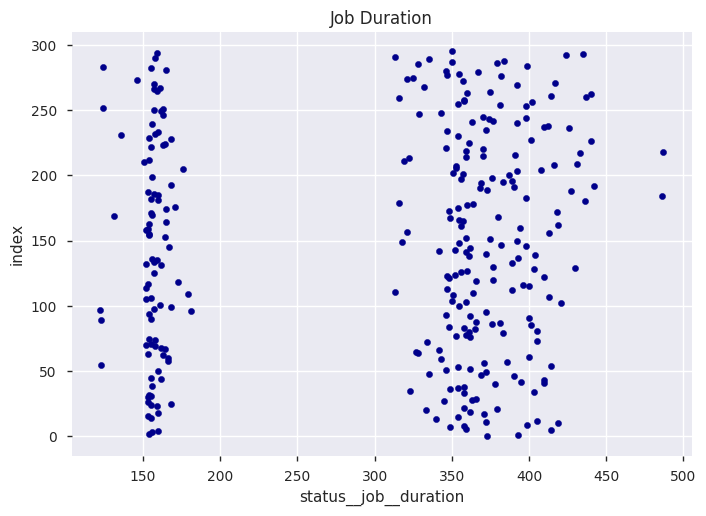

In [33]:
s_plot = df_duration.plot.scatter(x='status__job__duration',y = 'index', c='DarkBlue', title = 'Job Duration')

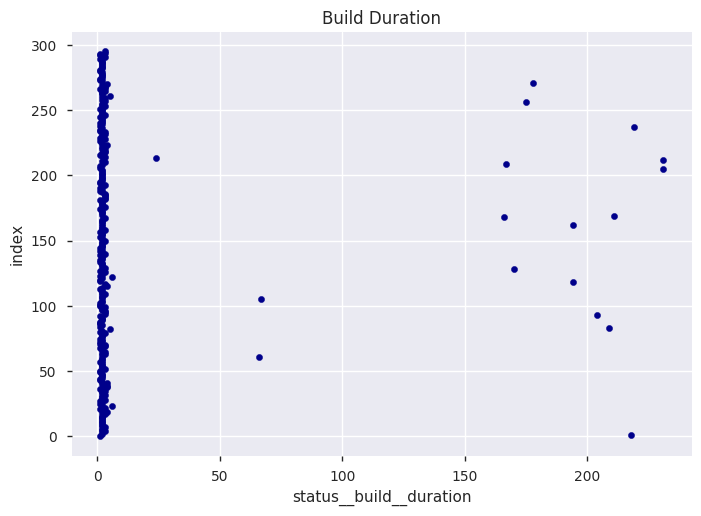

In [34]:
s_plot = df_duration.plot.scatter(x='status__build__duration',y = 'index', c='DarkBlue', title = 'Build Duration')

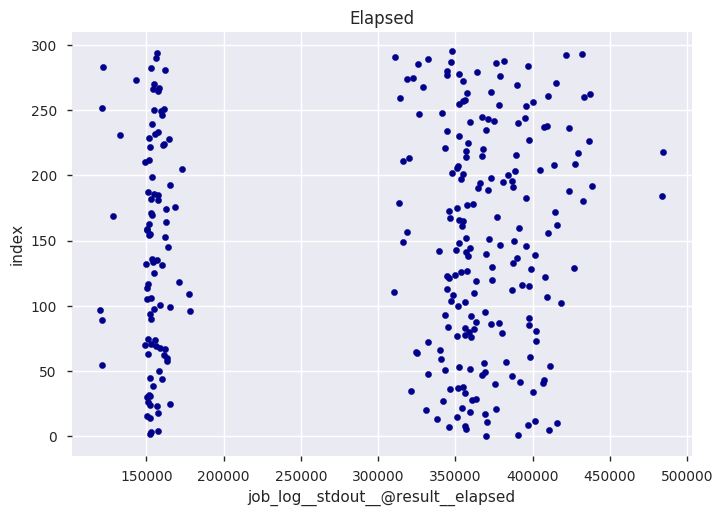

In [35]:
s_plot = df_duration.plot.scatter(x='job_log__stdout__@result__elapsed',y = 'index', c='DarkBlue', title = 'Elapsed')

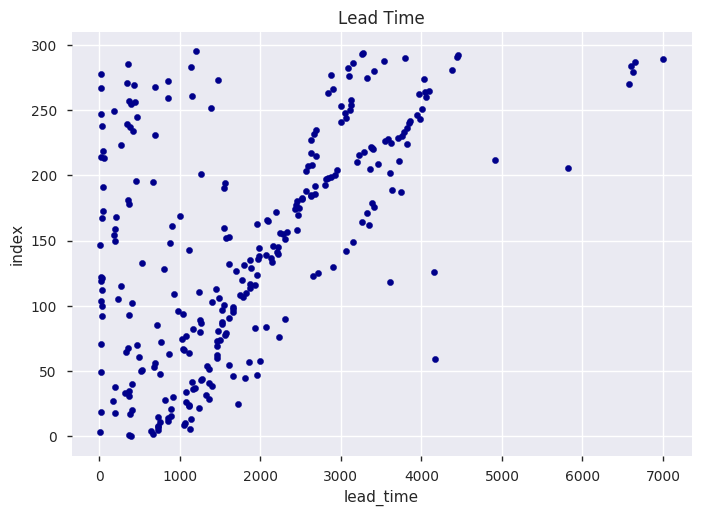

In [36]:
s_plot = df_duration.plot.scatter(x='lead_time',y = 'index', c='DarkBlue', title = 'Lead Time')

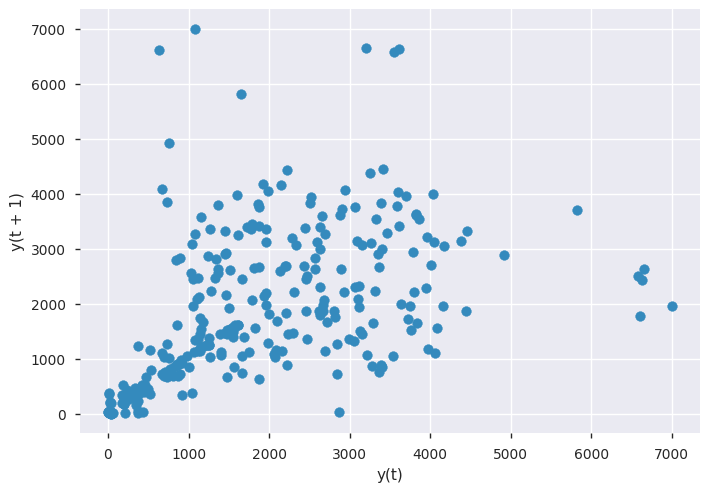

In [37]:
df = df_duration.sort_values(by=["created"])
lag_plot(df["lead_time"])

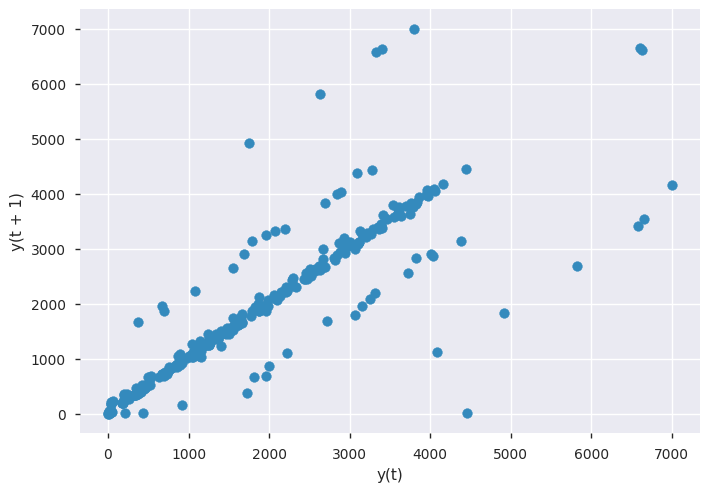

In [38]:
df = df_duration.sort_values(by=["status__job__started_at"])
lag_plot(df["lead_time"])

## Separation of left and right clusters <a name="seperate-left-and-right"></a>

In [39]:
df_left = df_duration[df_duration['status__job__duration'] < 250]
df_right = df_duration[df_duration['status__job__duration'] > 250]

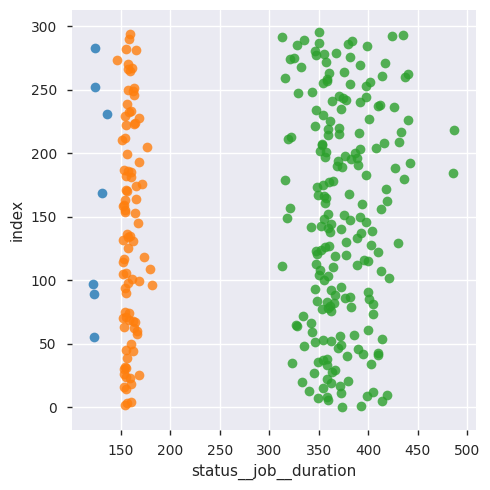

In [40]:
sns.lmplot( x="status__job__duration", y="index", data=df, fit_reg=False, hue='job_log__hwinfo__cpu__ncpus', legend=False)


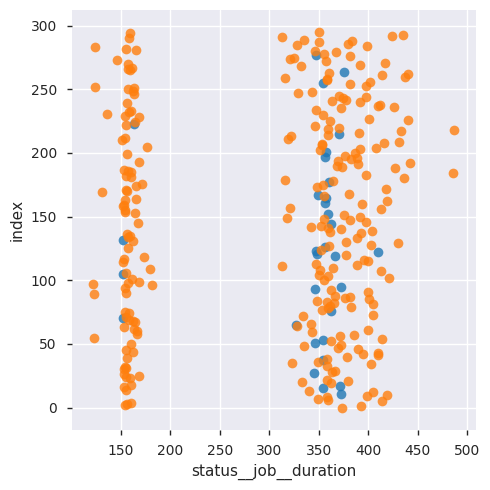

In [41]:
sns.lmplot( x="status__job__duration", y="index", data=df, fit_reg=False, hue='job_log__hwinfo__cpu__is_XEON', legend=False)


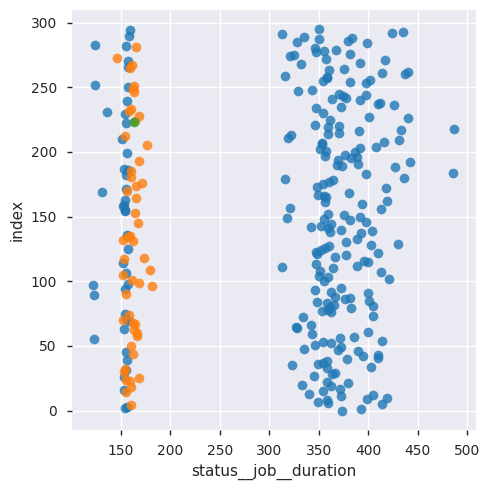

In [42]:
sns.lmplot( x="status__job__duration", y="index", data=df, fit_reg=False, hue='job_log__hwinfo__platform__platform', legend=False)


In [43]:
columns_to_analyze = [ "created", "status__build__started_at", "status__build__finished_at", 
                     "status__job__started_at", "status__job__finished_at","job_log__stdout__@result__rate", 
                     "job_log__stdout__@result__elapsed", "status__build__duration", "status__job__duration", 
                      "job_log__hwinfo__cpu__is_XEON", "job_log__hwinfo__cpu__ncpus", 
                      "job_log__hwinfo__platform__platform"]
df_duration['job_log__stdout__@result__elapsed'] = df_duration['job_log__stdout__@result__elapsed'].apply(lambda x: x*.001)

In [44]:
df_analyze = df_duration[columns_to_analyze]

In [45]:
df_analyze

,created,status__build__started_at,status__build__finished_at,status__job__started_at,status__job__finished_at,job_log__stdout__@result__rate,job_log__stdout__@result__elapsed,status__build__duration,status__job__duration,job_log__hwinfo__cpu__is_XEON,job_log__hwinfo__cpu__ncpus,job_log__hwinfo__platform__platform
0,2019-05-10 12:25:54.606897,2019-05-10 12:32:23+00:00,2019-05-10 12:32:24+00:00,2019-05-10 12:32:34+00:00,2019-05-10 12:38:47+00:00,0.000725,369.851182,1.0,373.0,True,64,Linux-3.10.0-862.9.1.el7.x86_64-x86_64-with-centos-7.6.1810-Core
1,2019-05-10 03:07:00.369512,2019-05-10 03:07:04+00:00,2019-05-10 03:10:42+00:00,2019-05-10 03:13:08+00:00,2019-05-10 03:19:41+00:00,0.000687,390.373325,218.0,393.0,True,64,Linux-3.10.0-862.9.1.el7.x86_64-x86_64-with-centos-7.6.1810-Core
2,2019-05-10 12:26:50.010847,2019-05-10 12:37:25+00:00,2019-05-10 12:37:27+00:00,2019-05-10 12:38:00+00:00,2019-05-10 12:40:34+00:00,0.001757,152.642012,2.0,154.0,True,32,Linux-3.10.0-862.9.1.el7.x86_64-x86_64-with-centos-7.6.1810-Core
3,2019-05-10 12:25:46.359680,2019-05-10 12:25:50+00:00,2019-05-10 12:25:52+00:00,2019-05-10 12:25:52+00:00,2019-05-10 12:28:28+00:00,0.001753,152.992137,2.0,156.0,True,32,Linux-3.10.0-862.9.1.el7.x86_64-x86_64-with-centos-7.6.1810-Core
4,2019-05-10 12:26:58.437661,2019-05-10 12:37:27+00:00,2019-05-10 12:37:30+00:00,2019-05-10 12:37:37+00:00,2019-05-10 12:40:17+00:00,0.001705,157.303990,3.0,160.0,True,32,Linux-3.10.0-862.3.3.el7.x86_64-x86_64-with-centos-7.6.1810-Core
5,2019-05-10 12:26:22.312520,2019-05-10 12:38:26+00:00,2019-05-10 12:38:28+00:00,2019-05-10 12:38:38+00:00,2019-05-10 12:45:32+00:00,0.000653,410.810619,2.0,414.0,True,64,Linux-3.10.0-862.9.1.el7.x86_64-x86_64-with-centos-7.6.1810-Core
6,2019-05-10 13:18:45.882777,2019-05-10 13:37:28+00:00,2019-05-10 13:37:30+00:00,2019-05-10 13:37:33+00:00,2019-05-10 13:43:32+00:00,0.000751,356.942096,2.0,359.0,True,64,Linux-3.10.0-862.9.1.el7.x86_64-x86_64-with-centos-7.6.1810-Core
7,2019-05-10 12:26:26.600640,2019-05-10 12:38:28+00:00,2019-05-10 12:38:31+00:00,2019-05-10 12:38:37+00:00,2019-05-10 12:44:26+00:00,0.000775,345.998102,3.0,349.0,True,64,Linux-3.10.0-862.9.1.el7.x86_64-x86_64-with-centos-7.6.1810-Core
8,2019-05-10 12:26:49.472458,2019-05-10 12:38:53+00:00,2019-05-10 12:38:55+00:00,2019-05-10 12:39:02+00:00,2019-05-10 12:45:00+00:00,0.000753,356.031537,2.0,358.0,True,64,Linux-3.10.0-862.9.1.el7.x86_64-x86_64-with-centos-7.6.1810-Core
9,2019-05-10 13:20:06.598433,2019-05-10 13:37:29+00:00,2019-05-10 13:37:31+00:00,2019-05-10 13:37:39+00:00,2019-05-10 13:44:18+00:00,0.000676,396.782309,2.0,399.0,True,64,Linux-3.10.0-862.9.1.el7.x86_64-x86_64-with-centos-7.6.1810-Core


In [46]:
df_left = df_analyze[df_analyze['status__job__duration'] < 250]
df_right = df_analyze[df_analyze['status__job__duration'] > 250]

In [47]:
len(df_left)

96

In [48]:
len(df_right)

200

## Descriptive analysis of the left cluster and the right cluster <a name="descriptive-analysis"></a>

**Elapsed**

In [49]:
df_analyze["job_log__stdout__@result__elapsed"].describe()

count    296.000000
mean     300.761476
std      105.028556
min      119.850403
25%      160.435956
50%      351.683826
75%      376.688536
max      484.622079
Name: job_log__stdout__@result__elapsed, dtype: float64

In [50]:
df_left["job_log__stdout__@result__elapsed"].describe()

count     96.000000
mean     154.275528
std       10.511997
min      119.850403
25%      151.902867
50%      154.289465
75%      159.571100
max      178.446759
Name: job_log__stdout__@result__elapsed, dtype: float64

In [51]:
df_right["job_log__stdout__@result__elapsed"].describe()

count    200.000000
mean     371.074731
std       31.293318
min      310.161917
25%      351.344139
50%      364.410660
75%      392.504197
max      484.622079
Name: job_log__stdout__@result__elapsed, dtype: float64

**Build Duration**

In [52]:
df_analyze["status__build__duration"].describe()

count    296.000000
mean      11.827703
std       42.119451
min        1.000000
25%        2.000000
50%        2.000000
75%        3.000000
max      231.000000
Name: status__build__duration, dtype: float64

In [53]:
df_left["status__build__duration"].describe()

count     96.000000
mean      11.802083
std       43.588656
min        1.000000
25%        2.000000
50%        2.000000
75%        3.000000
max      231.000000
Name: status__build__duration, dtype: float64

In [54]:
df_right["status__build__duration"].describe()

count    200.000000
mean      11.840000
std       41.507212
min        1.000000
25%        2.000000
50%        2.000000
75%        2.000000
max      219.000000
Name: status__build__duration, dtype: float64

**Job Duration**

In [55]:
df_analyze["status__job__duration"].describe()

count    296.000000
mean     303.206081
std      105.214461
min      122.000000
25%      162.750000
50%      354.000000
75%      379.250000
max      487.000000
Name: status__job__duration, dtype: float64

In [56]:
df_left["status__job__duration"].describe()

count     96.000000
mean     156.510417
std       10.583995
min      122.000000
25%      154.000000
50%      157.000000
75%      162.000000
max      181.000000
Name: status__job__duration, dtype: float64

In [57]:
df_right["status__job__duration"].describe()

count    200.000000
mean     373.620000
std       31.505373
min      313.000000
25%      353.750000
50%      367.500000
75%      395.250000
max      487.000000
Name: status__job__duration, dtype: float64

**Difference between the elapsed and job duration**

In [58]:
(df_analyze["status__job__duration"] - df_analyze["job_log__stdout__@result__elapsed"]).describe()

count    296.000000
mean       2.444605
std        0.528684
min        1.301028
25%        2.033681
50%        2.430507
75%        2.780683
max        3.956015
dtype: float64

In [59]:
(df_left["status__job__duration"] - df_left["job_log__stdout__@result__elapsed"]).describe()

count    96.000000
mean      2.234888
std       0.433345
min       1.357988
25%       1.839633
50%       2.258989
75%       2.537480
max       3.245371
dtype: float64

In [60]:
(df_right["status__job__duration"] - df_right["job_log__stdout__@result__elapsed"]).describe()

count    200.000000
mean       2.545269
std        0.541568
min        1.301028
25%        2.133902
50%        2.523004
75%        2.925377
max        3.956015
dtype: float64

**Correlations within the left cluster**

In [63]:
df_left.corr(method ='pearson') 

,job_log__stdout__@result__rate,job_log__stdout__@result__elapsed,status__build__duration,status__job__duration,job_log__hwinfo__cpu__is_XEON,job_log__hwinfo__cpu__ncpus
job_log__stdout__@result__rate,1.000000,-0.991601,-0.003654,-0.990335,-0.019051,-0.873486
job_log__stdout__@result__elapsed,-0.991601,1.000000,0.029801,0.999179,0.034491,0.814448
status__build__duration,-0.003654,0.029801,1.000000,0.034195,-0.034613,-0.129711
status__job__duration,-0.990335,0.999179,0.034195,1.000000,0.034864,0.808887
job_log__hwinfo__cpu__is_XEON,-0.019051,0.034491,-0.034613,0.034864,1.000000,-0.058478
job_log__hwinfo__cpu__ncpus,-0.873486,0.814448,-0.129711,0.808887,-0.058478,1.000000


In [64]:
df_right.corr(method = 'pearson')

,job_log__stdout__@result__rate,job_log__stdout__@result__elapsed,status__build__duration,status__job__duration,job_log__hwinfo__cpu__is_XEON,job_log__hwinfo__cpu__ncpus
job_log__stdout__@result__rate,1.000000,-0.993213,-0.159052,-0.993146,-0.182227,NaN
job_log__stdout__@result__elapsed,-0.993213,1.000000,0.157291,0.999874,0.194709,NaN
status__build__duration,-0.159052,0.157291,1.000000,0.156940,0.023847,NaN
status__job__duration,-0.993146,0.999874,0.156940,1.000000,0.196871,NaN
job_log__hwinfo__cpu__is_XEON,-0.182227,0.194709,0.023847,0.196871,1.000000,NaN
job_log__hwinfo__cpu__ncpus,NaN,NaN,NaN,NaN,NaN,NaN
